In [2]:
from torch.utils.data import Dataset, DataLoader, random_split

# Crear un Dataset 
class TimeSeriesDataset(Dataset):
    def __init__(self, dataframe):
        # Asegurarse de que no haya datos faltantes
        self.data = dataframe.dropna(subset=['presion', 'h20', 'temperatura', 'qv', 'delp', 'freq', 'tempbrillo'])

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        
        # Convertir cada columna a tensor de PyTorch, extrayendo solo el primer valor en caso de que sea un array
        inputs = torch.stack([tengo 
            torch.tensor(row['presion'][0] if isinstance(row['presion'], (list, np.ndarray)) else row['presion'], dtype=torch.float32), 
            torch.tensor(row['h20'][0] if isinstance(row['h20'], (list, np.ndarray)) else row['h20'], dtype=torch.float32), 
            torch.tensor(row['temperatura'][0] if isinstance(row['temperatura'], (list, np.ndarray)) else row['temperatura'], dtype=torch.float32), 
            torch.tensor(row['qv'][0] if isinstance(row['qv'], (list, np.ndarray)) else row['qv'], dtype=torch.float32), 
            torch.tensor(row['delp'][0] if isinstance(row['delp'], (list, np.ndarray)) else row['delp'], dtype=torch.float32), 
            torch.tensor(row['freq'][0] if isinstance(row['freq'], (list, np.ndarray)) else row['freq'], dtype=torch.float32), 
            torch.tensor(row['tempbrillo'][0] if isinstance(row['tempbrillo'], (list, np.ndarray)) else row['tempbrillo'], dtype=torch.float32)
        ], dim=0)
        
        # En este caso 'h20' es el target
        targets = torch.tensor(row['h20'], dtype=torch.float32)
        
        return inputs, targets


In [ ]:
# Crear el Dataset a partir del DataFrame
dataset = TimeSeriesDataset(df)

# Definir las proporciones para entrenamiento, validación y test
train_size = int(0.7 * len(dataset))  # 70% para entrenamiento
val_size = int(0.15 * len(dataset))   # 15% para validación
test_size = len(dataset) - train_size - val_size  # 15% para test

# Dividir el dataset 
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

# Verifica las longitudes de cada conjunto
print(len(train_dataset), len(val_dataset), len(test_dataset))

In [86]:
# Crear los DataLoaders 
batch_size = 32  

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Verificar que los DataLoaders se hayan creado correctamente
print(f'Tamaño del batch en el DataLoader de entrenamiento: {len(train_loader)}')
print(f'Tamaño del batch en el DataLoader de validación: {len(val_loader)}')
print(f'Tamaño del batch en el DataLoader de test: {len(test_loader)}')


Tamaño del batch en el DataLoader de entrenamiento: 460
Tamaño del batch en el DataLoader de validación: 99
Tamaño del batch en el DataLoader de test: 99


In [87]:
import torch

# Guardar el dataset de entrenamiento, validación y test
torch.save(train_dataset, 'train_dataset.pth')
torch.save(val_dataset, 'val_dataset.pth')
torch.save(test_dataset, 'test_dataset.pth')

print("Los datasets se han guardado como archivos .pth.")


Los datasets se han guardado como archivos .pth.


In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from torch.utils.data import DataLoader

# Cargar los datasets
train_dataset = torch.load('train_dataset.pth')
val_dataset = torch.load('val_dataset.pth')
test_dataset = torch.load('test_dataset.pth')

# Función para convertir los DataLoaders a matrices numpy
def load_data_from_loader(dataset, batch_size=32):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    
    inputs_list = []
    targets_list = []
    for inputs, targets in loader:
        inputs_list.append(inputs.detach().numpy())  # Usamos .detach() antes de convertir a numpy
        targets_list.append(targets.detach().numpy())  # Lo mismo con los targets
    
    inputs_data = np.concatenate(inputs_list, axis=0)
    targets_data = np.concatenate(targets_list, axis=0)
    
    return inputs_data, targets_data

# Cargar los datos de entrenamiento, validación y prueba
train_inputs, train_targets = load_data_from_loader(train_dataset)
val_inputs, val_targets = load_data_from_loader(val_dataset)
test_inputs, test_targets = load_data_from_loader(test_dataset)

# Normalizar los datos de entrada
scaler = StandardScaler()
train_inputs = scaler.fit_transform(train_inputs)
val_inputs = scaler.transform(val_inputs)
test_inputs = scaler.transform(test_inputs)





Modelos
==========

In [78]:
import matplotlib.pyplot as plt
import numpy as np

def plot_profiles(true_values, predictions, num_samples_to_plot=5): #funcion para plotear
    """
    Función para graficar los perfiles de las primeras muestras.
    true_values: Valores reales (matriz [num_samples, output_size])
    predictions: Predicciones del modelo (matriz [num_samples, output_size])
    num_samples_to_plot: Número de muestras a graficar.
    """

    sample_to_plot = 24  

    print(f"Dimensiones de true_values: {true_values.shape}")
    print(f"Dimensiones de predictions: {predictions.shape}")

    # Si sample_to_plot está dentro de rango
    if sample_to_plot < true_values.shape[0] and sample_to_plot < predictions.shape[0]:
        plt.figure(figsize=(12, 8))

        # Crear una sola subgráfica para la muestra
        ax = plt.subplot(1, 1, 1)

        ax.plot(true_values[sample_to_plot, :], range(true_values.shape[1]), label='True Profile', marker='o', linestyle='-', color='b')
        ax.plot(predictions[sample_to_plot, :], range(predictions.shape[1]), label='Predicted Profile', marker='x', linestyle='--', color='r')

        # Títulos y etiquetas de los ejes
        ax.set_title(f'Profile for Sample {sample_to_plot + 1}')
        ax.set_ylabel('Indice de Presion')  
        ax.set_xlabel('Water Level (H2O)')  

        # Ajustar el aspecto del gráfico
        ax.set_aspect('auto', adjustable='box')  # Esto asegura que el gráfico se ajuste correctamente y se rote si es necesario

        
        plt.gca().invert_yaxis()
        ax.legend()
        plt.tight_layout()
        plt.show()
    else:
        print(f"sample_to_plot ({sample_to_plot}) está fuera de rango para las filas de los datos.")


DecisionTree Model
Mean Absolute Error: 0.0009
Root Mean Squared Error: 0.0019
Average R² Score: 0.7136
Dimensiones de true_values: (3155, 26)
Dimensiones de predictions: (3155, 26)


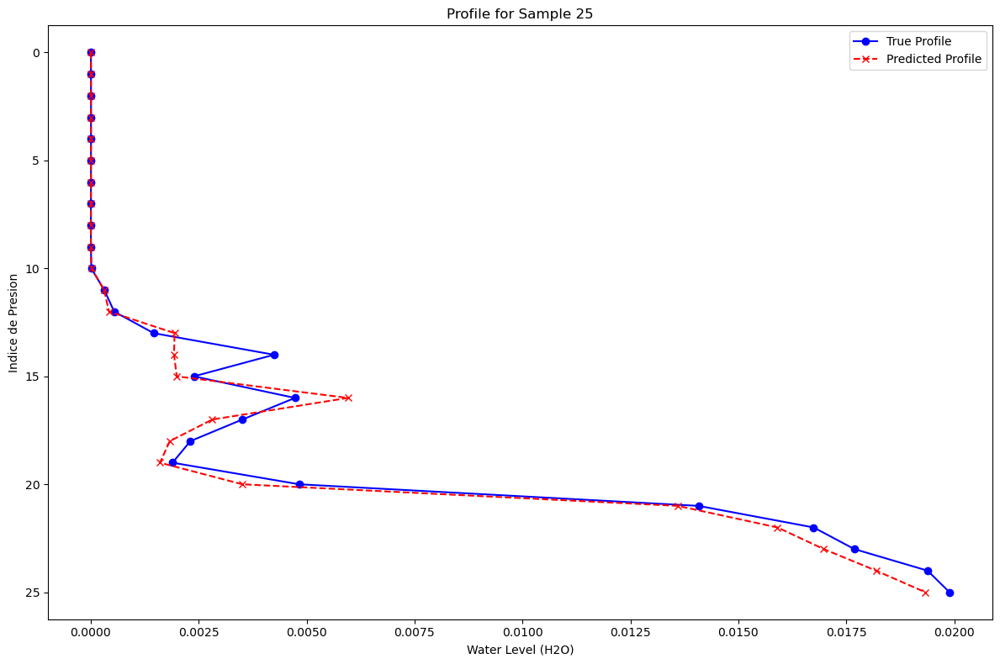

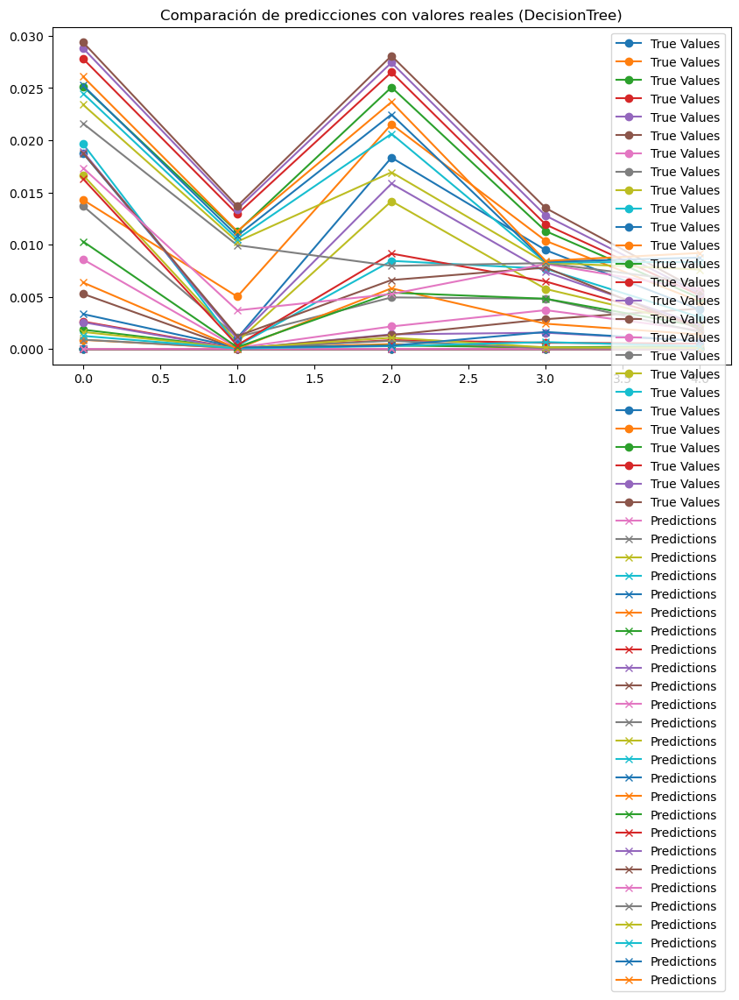

(DecisionTreeRegressor(random_state=42),
 0.0008587260908114789,
 0.0019148605981635588,
 0.7136006822778124)

In [74]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

def train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets):
    # Entrenar el modelo
    model = DecisionTreeRegressor(random_state=42)
    model.fit(train_inputs, train_targets)

    # Evaluar el modelo
    predictions = model.predict(test_inputs)
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)

    print(f"DecisionTree Model")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Average R² Score: {r2_avg:.4f}")
    plot_profiles(test_targets, predictions)
    plt.figure(figsize=(10, 5))
    plt.plot(test_targets[:5], label='True Values', marker='o')
    plt.plot(predictions[:5], label='Predictions', marker='x')
    plt.legend()
    plt.title('Comparación de predicciones con valores reales (DecisionTree)')
    plt.show()

    return model, mae, rmse, r2_avg
train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets)

Ridge Model
Mean Absolute Error: 0.0010
Root Mean Squared Error: 0.0018
Average R² Score: 0.6652
Dimensiones de true_values: (3155, 26)
Dimensiones de predictions: (3155, 26)


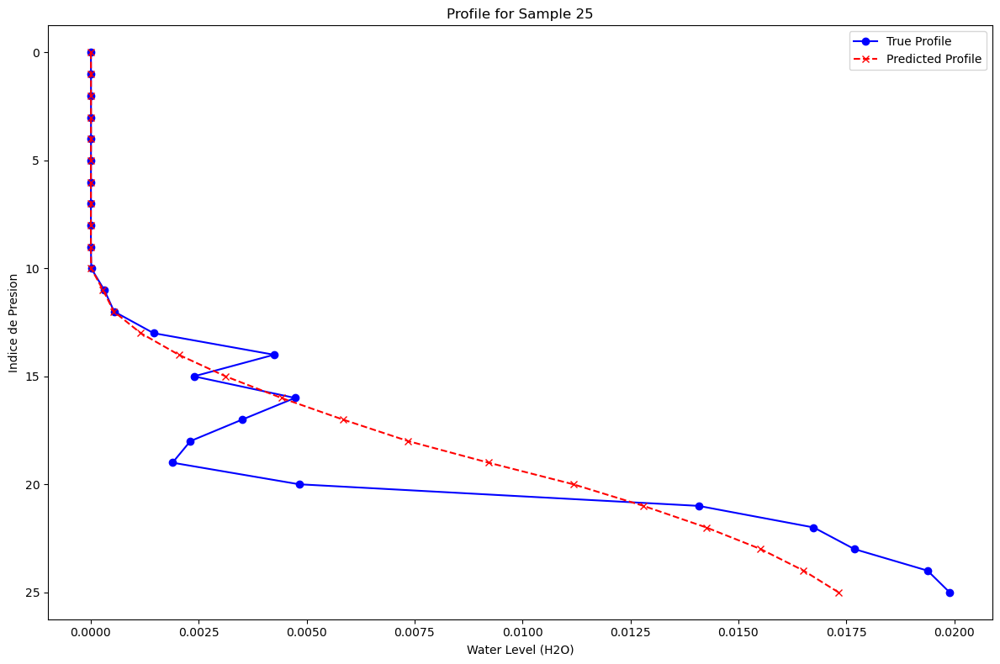

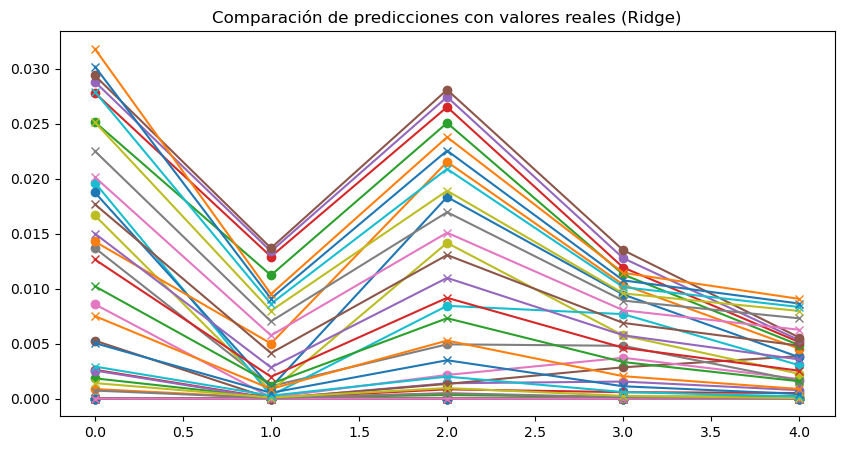

(Ridge(alpha=0.1), 0.0009525596, 0.0018476506, 0.6651840209960938)

In [58]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import matplotlib.pyplot as plt

def train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets, alpha=0.1):
    # Entrenar el modelo
    model = Ridge(alpha=alpha)
    model.fit(train_inputs, train_targets)

    # Evaluar el modelo
    predictions = model.predict(test_inputs)
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)

    print(f"Ridge Model")
    print(f"Mean Absolute Error: {mae:.4f}")
    print(f"Root Mean Squared Error: {rmse:.4f}")
    print(f"Average R² Score: {r2_avg:.4f}")
    plot_profiles(test_targets, predictions)
    plt.figure(figsize=(10, 5))
    plt.plot(test_targets[:5], label='True Values', marker='o')
    plt.plot(predictions[:5], label='Predictions', marker='x')
    plt.title('Comparación de predicciones con valores reales (Ridge)')
    plt.show()

    return model, mae, rmse, r2_avg
train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets)



VALIDACIÓN CRUZADA
========================

C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
180 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
121 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py", line 666, in _validate_params
    validate

Mejores hiperparámetros encontrados por GridSearchCV:
{'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 2}
Validación cruzada (5 pliegues) - R² promedio: 0.7964
Desviación estándar de R² en validación cruzada: 0.0034

Evaluación del modelo en el conjunto de test:
Mean Absolute Error (MAE): 0.0007
Root Mean Squared Error (RMSE): 0.0016
R² Score en Test Set: 0.7994
Dimensiones de true_values: (3155, 26)
Dimensiones de predictions: (3155, 26)


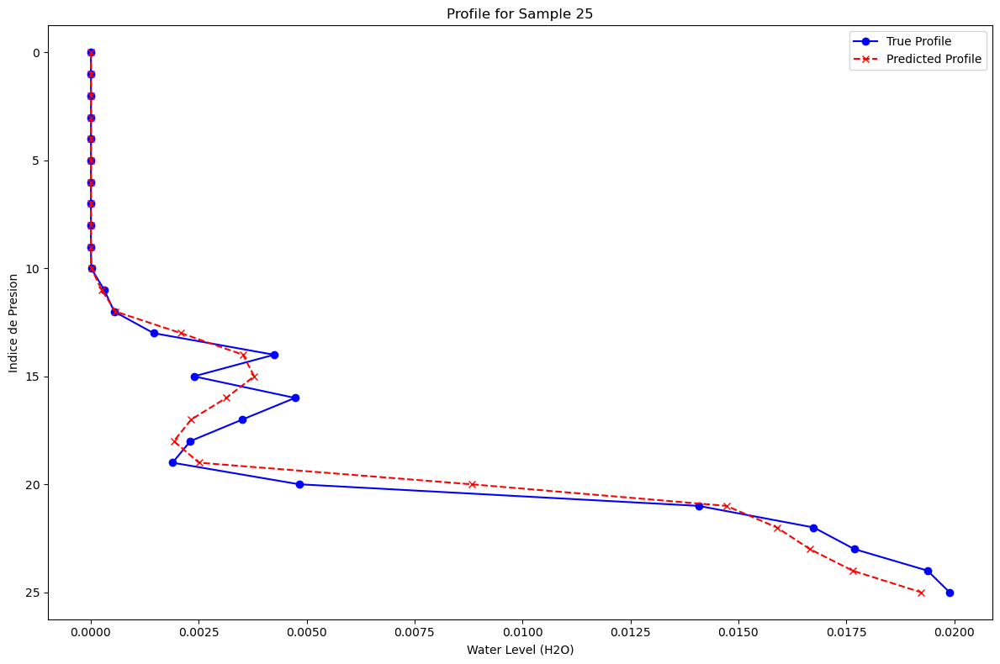

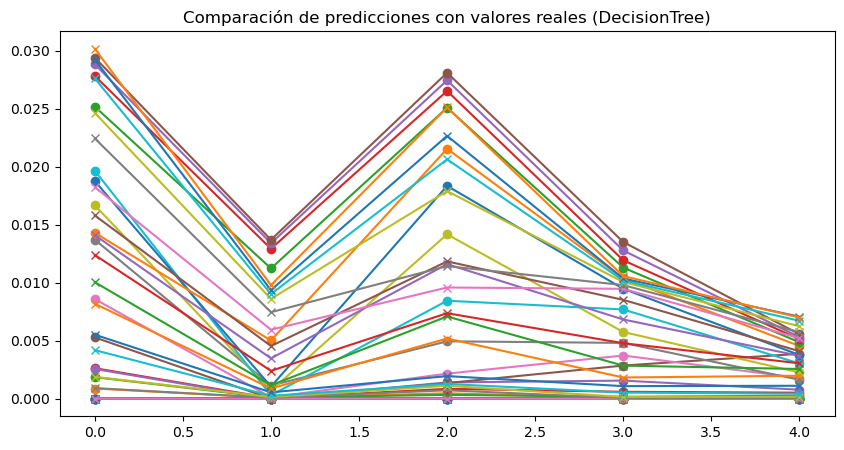

(DecisionTreeRegressor(min_samples_leaf=5, random_state=42),
 0.0007429363300127655,
 0.0015998037074537435,
 0.7994240750337803,
 0.7964020863657749,
 0.0033574633528387033)

In [59]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, GridSearchCV
import matplotlib.pyplot as plt

def train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets):
    # Crear el modelo
    model = DecisionTreeRegressor(random_state=42)
    
    # Establecer los parámetros para la búsqueda en cuadrícula
    param_grid = {
        'max_depth': [3, 5, 7, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 5],
        'max_features': ['auto', 'sqrt', 'log2', None]
    }

    # Búsqueda en cuadrícula con validación cruzada (5 pliegues)
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(train_inputs, train_targets)
    
    # Mejor modelo encontrado a través de la búsqueda en cuadrícula
    best_model = grid_search.best_estimator_

    # Mostrar los mejores hiperparámetros seleccionados por GridSearchCV
    print("Mejores hiperparámetros encontrados por GridSearchCV:")
    print(grid_search.best_params_)

    # Evaluación utilizando validación cruzada
    cv_r2_scores = cross_val_score(best_model, train_inputs, train_targets, cv=5, scoring='r2')
    print(f"Validación cruzada (5 pliegues) - R² promedio: {cv_r2_scores.mean():.4f}")
    print(f"Desviación estándar de R² en validación cruzada: {cv_r2_scores.std():.4f}")
    
    # Entrenar el mejor modelo en todo el conjunto de entrenamiento
    best_model.fit(train_inputs, train_targets)
    
    # Evaluación en el conjunto de test
    predictions = best_model.predict(test_inputs)
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)
    
    print(f"\nEvaluación del modelo en el conjunto de test:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"R² Score en Test Set: {r2_avg:.4f}")
    plot_profiles(test_targets, predictions)
    plt.figure(figsize=(10, 5))
    plt.plot(test_targets[:5], label='True Values', marker='o')
    plt.plot(predictions[:5], label='Predictions', marker='x')
    plt.title('Comparación de predicciones con valores reales (DecisionTree)')
    plt.show()

    return best_model, mae, rmse, r2_avg, cv_r2_scores.mean(), cv_r2_scores.std()

train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets)


Mejores hiperparámetros encontrados por GridSearchCV:
{'alpha': 1e-06}
Validación cruzada (5 pliegues) - R² promedio: 0.6610
Desviación estándar de R² en validación cruzada: 0.0041

Evaluación del modelo en el conjunto de test:
Mean Absolute Error (MAE): 0.0010
Root Mean Squared Error (RMSE): 0.0018
R² Score en Test Set: 0.6654
Dimensiones de true_values: (3155, 26)
Dimensiones de predictions: (3155, 26)


C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.72747e-11): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.72226e-11): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


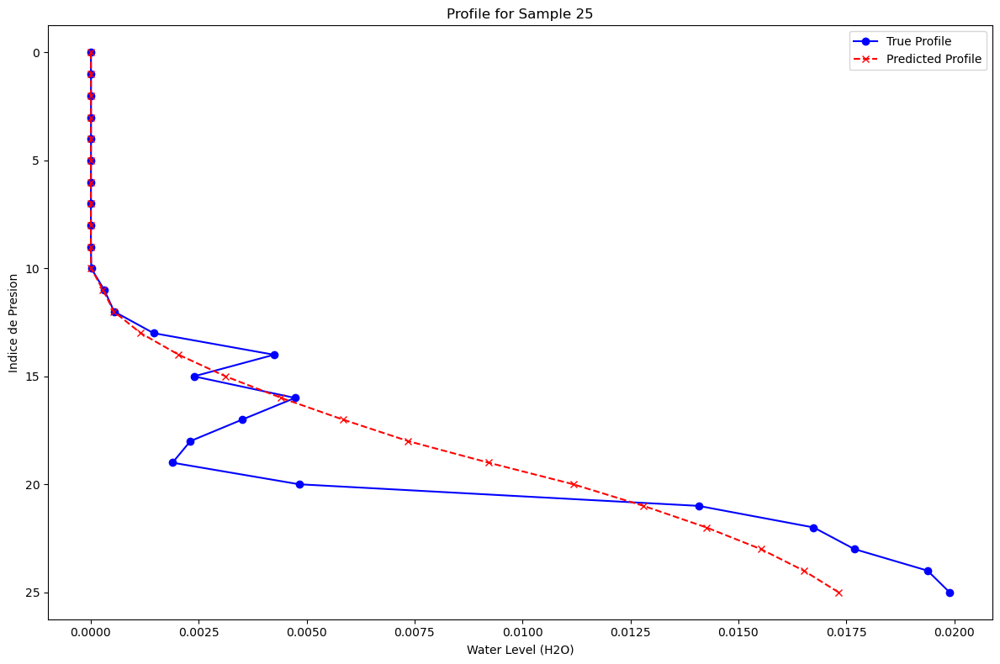

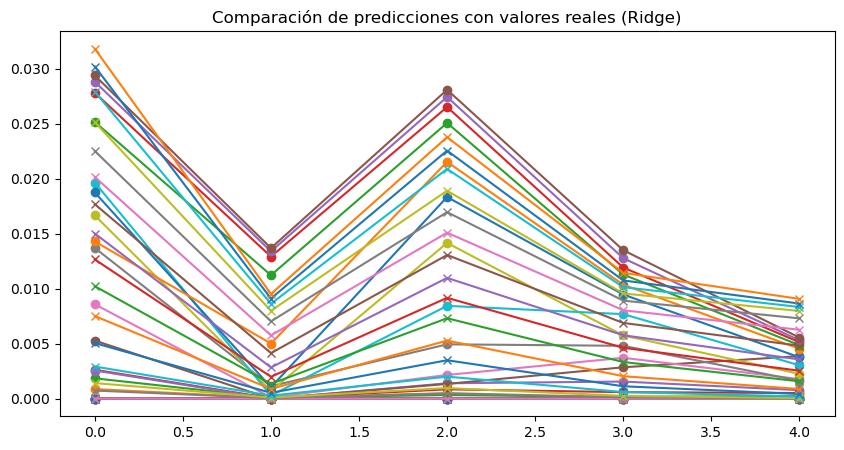

(Ridge(alpha=1e-06),
 0.0009522531,
 0.0018472055,
 0.6653857827186584,
 0.6609591722488404,
 0.004074242133004054)

In [61]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

def train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets):
    # Normalizar las características (esto es clave para la regresión Ridge)
    scaler = StandardScaler()
    train_inputs_scaled = scaler.fit_transform(train_inputs)
    test_inputs_scaled = scaler.transform(test_inputs)
    
    # Crear el modelo Ridge
    model = Ridge()

    # Establecer los parámetros para la búsqueda en cuadrícula (GridSearchCV)
    param_grid = {'alpha': np.logspace(-6, 6, 13)}  # rango de alpha desde muy pequeño a muy grande

    # Búsqueda en cuadrícula con validación cruzada (5 pliegues)
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(train_inputs_scaled, train_targets)
    
    # Obtener el mejor modelo encontrado por GridSearchCV
    best_model = grid_search.best_estimator_
    best_alpha = grid_search.best_params_['alpha']

    # Mostrar los mejores hiperparámetros seleccionados por GridSearchCV
    print("Mejores hiperparámetros encontrados por GridSearchCV:")
    print(grid_search.best_params_)

    # Evaluación utilizando validación cruzada
    cv_r2_scores = cross_val_score(best_model, train_inputs_scaled, train_targets, cv=5, scoring='r2')
    print(f"Validación cruzada (5 pliegues) - R² promedio: {cv_r2_scores.mean():.4f}")
    print(f"Desviación estándar de R² en validación cruzada: {cv_r2_scores.std():.4f}")
    
    # Ahora entrenamos el modelo en todo el conjunto de entrenamiento
    best_model.fit(train_inputs_scaled, train_targets)
    
    # Evaluar el modelo en el conjunto de test
    predictions = best_model.predict(test_inputs_scaled)
    
    # Métricas de evaluación en el conjunto de test
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)
    
    print(f"\nEvaluación del modelo en el conjunto de test:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"R² Score en Test Set: {r2_avg:.4f}")
    plot_profiles(test_targets, predictions)
    plt.figure(figsize=(10, 5))
    plt.plot(test_targets[:5], label='True Values', marker='o')
    plt.plot(predictions[:5], label='Predictions', marker='x')
    plt.title('Comparación de predicciones con valores reales (Ridge)')
    plt.show()

    return best_model, mae, rmse, r2_avg, cv_r2_scores.mean(), cv_r2_scores.std()


train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets)


Mejores hiperparámetros encontrados por GridSearchCV:
{'alpha': 1e-06}
Validación cruzada (5 pliegues) - R² promedio: 0.6610
Desviación estándar de R² en validación cruzada: 0.0041

Evaluación del modelo en el conjunto de test:
Mean Absolute Error (MAE): 0.0010
Root Mean Squared Error (RMSE): 0.0018
R² Score en Test Set: 0.6654


C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.72747e-11): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T
C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\linear_model\_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=2.72226e-11): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


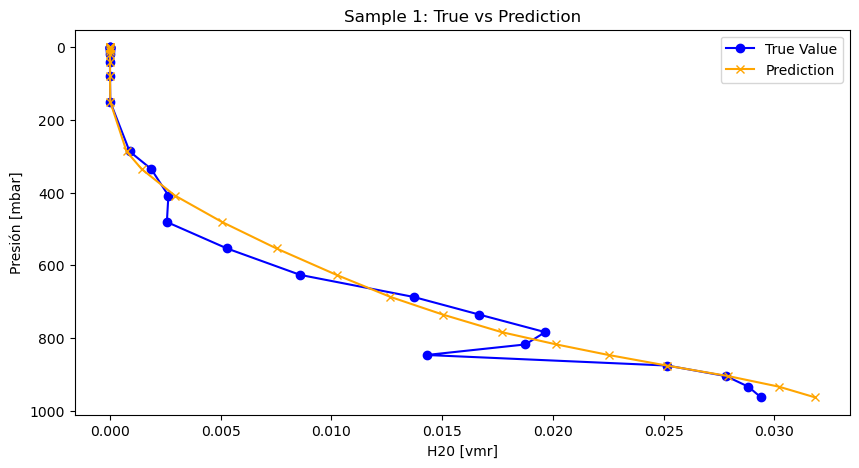

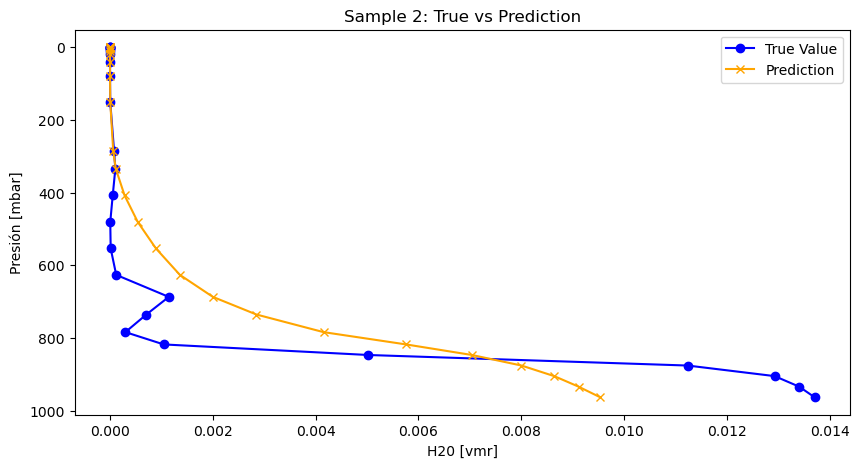

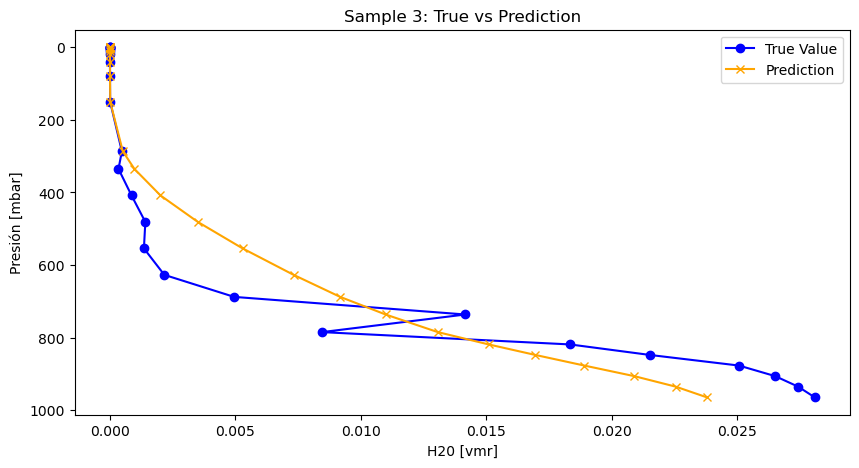

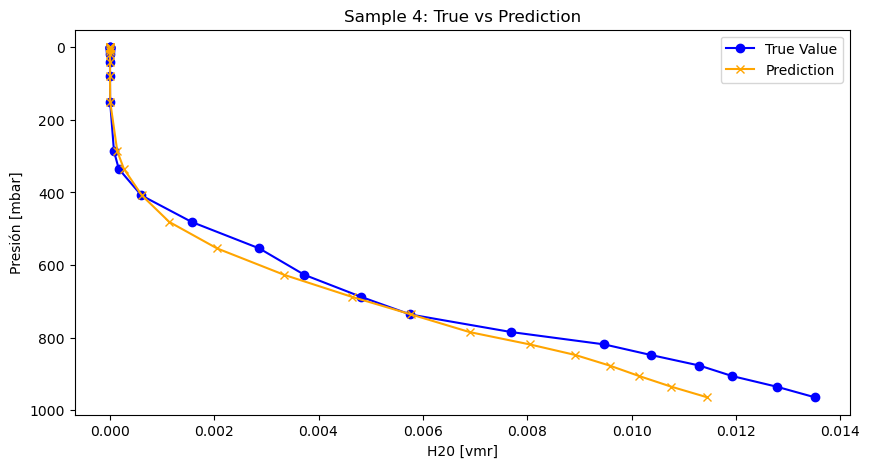

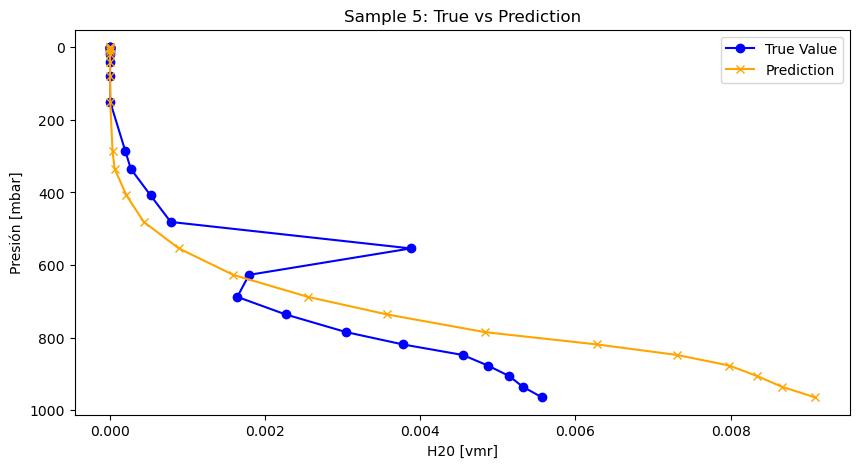

...

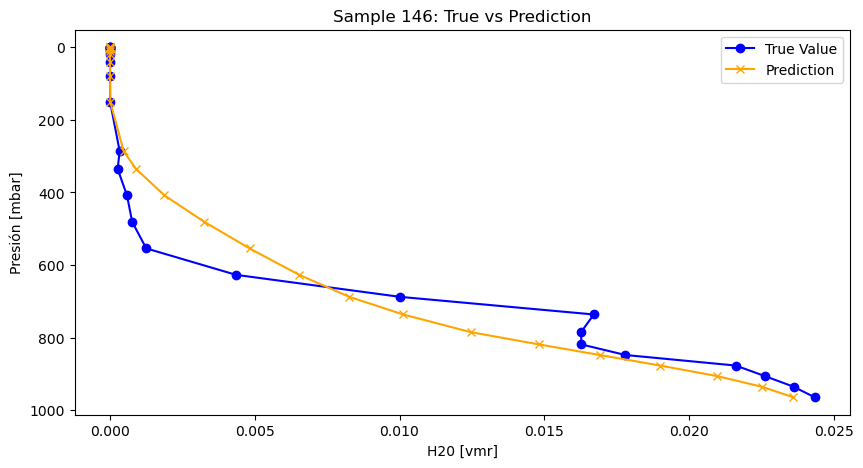

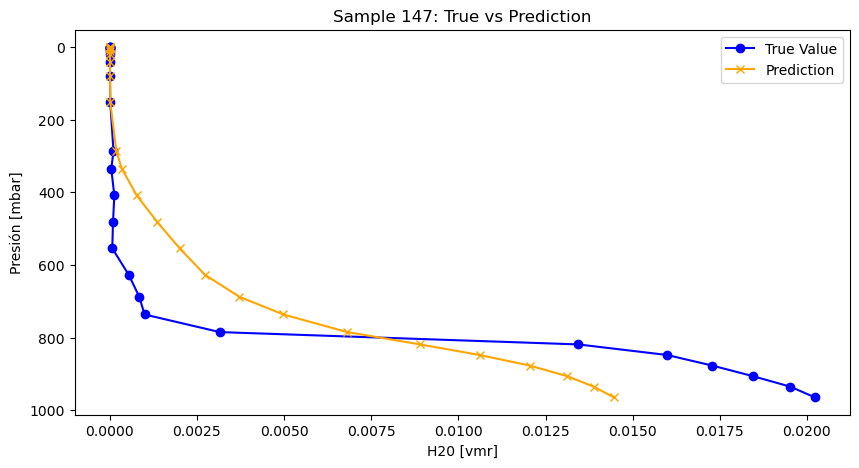

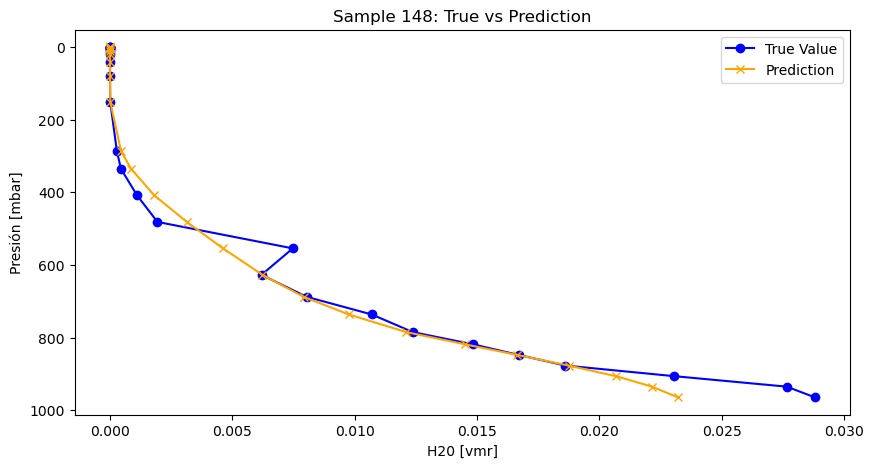

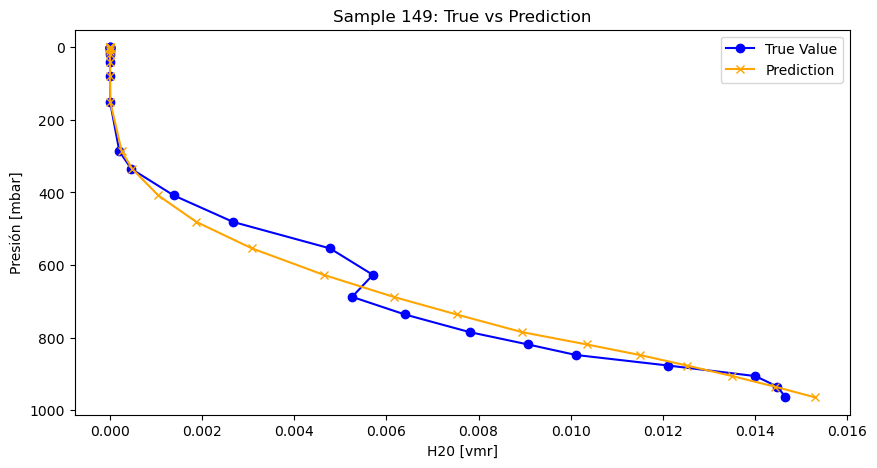

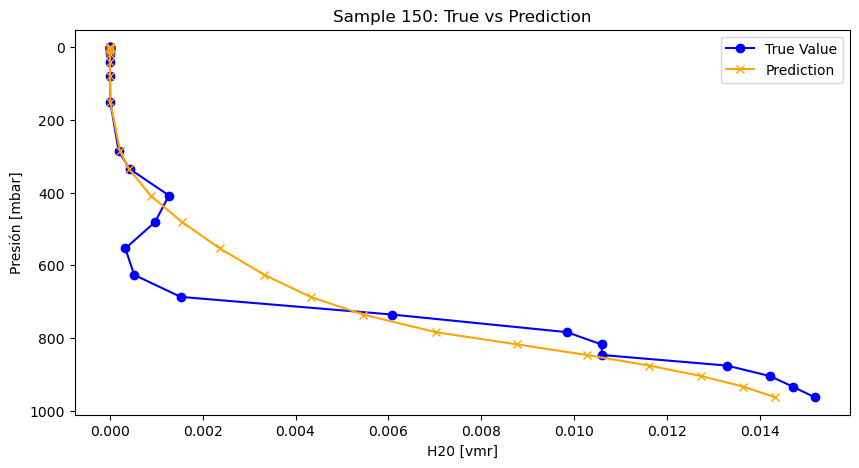

(Ridge(alpha=1e-06),
 0.0009522531,
 0.0018472055,
 0.6653857827186584,
 0.6609591722488404,
 0.004074242133004054)

In [119]:
import numpy as np
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, GridSearchCV
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import zipfile


def load_pressure_data(file_index, zip_path="atributos.zip"):
    """Carga la primera columna (presión) del archivo correspondiente dentro del ZIP."""
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        # Construir el nombre del archivo dentro del ZIP directamente sin subcarpetas
        file_name = f"atributos/{file_index}.txt"
        
        # Verificar si el archivo existe dentro del ZIP
        if file_name not in zip_ref.namelist():
            raise FileNotFoundError(f"Archivo {file_name} no encontrado en el ZIP.")
        
        # Abrir el archivo dentro del ZIP y cargar los datos
        with zip_ref.open(file_name) as file:
            # Leer las líneas, decodificar y reemplazar las comas
            lines = [line.decode('utf-8').replace(',', '') for line in file.readlines()]
            # Convertir el contenido limpio en un array numpy
            data = np.loadtxt(lines)
    
    # Retornar solo la primera columna (presión)
    return data[:, 0]  # Primera columna: presión


def plot_profiles(test_targets, predictions, file_indices, zip_path="atributos.zip"):
    """
    Genera gráficos para cada predicción, considerando las presiones del archivo correspondiente dentro del ZIP.
    """
    for i, index in enumerate(file_indices[:150]):  # Graficar solo los primeros 5
        pressures = load_pressure_data(index, zip_path)
        plt.figure(figsize=(10, 5))
        plt.plot(test_targets[i], pressures, label='True Value', marker='o', color='blue')  # Invertir ejes
        plt.plot(predictions[i], pressures, label='Prediction', marker='x', color='orange')  # Invertir ejes
        plt.title(f"Sample {index}: True vs Prediction")
        plt.xlabel("H20 [vmr]")  # Ahora h20 está en el eje horizontal
        plt.ylabel("Presión [mbar]")  # Presión en el eje vertical
        plt.gca().invert_yaxis()  # Invertir el eje Y para que la presión se represente correctamente
        plt.legend()
        plt.show()


def train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets, test_indices, zip_path="atributos.zip"):
    # Normalizar las características (esto es clave para la regresión Ridge)
    scaler = StandardScaler()
    train_inputs_scaled = scaler.fit_transform(train_inputs)
    test_inputs_scaled = scaler.transform(test_inputs)
    
    # Crear el modelo Ridge
    model = Ridge()

    # Establecer los parámetros para la búsqueda en cuadrícula (GridSearchCV)
    param_grid = {'alpha': np.logspace(-6, 6, 13)}  # rango de alpha desde muy pequeño a muy grande

    # Búsqueda en cuadrícula con validación cruzada (5 pliegues)
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(train_inputs_scaled, train_targets)
    
    # Obtener el mejor modelo encontrado por GridSearchCV
    best_model = grid_search.best_estimator_
    best_alpha = grid_search.best_params_['alpha']

    # Mostrar los mejores hiperparámetros seleccionados por GridSearchCV
    print("Mejores hiperparámetros encontrados por GridSearchCV:")
    print(grid_search.best_params_)

    # Evaluación utilizando validación cruzada
    cv_r2_scores = cross_val_score(best_model, train_inputs_scaled, train_targets, cv=5, scoring='r2')
    print(f"Validación cruzada (5 pliegues) - R² promedio: {cv_r2_scores.mean():.4f}")
    print(f"Desviación estándar de R² en validación cruzada: {cv_r2_scores.std():.4f}")
    
    # Ahora entrenamos el modelo en todo el conjunto de entrenamiento
    best_model.fit(train_inputs_scaled, train_targets)
    
    # Evaluar el modelo en el conjunto de test
    predictions = best_model.predict(test_inputs_scaled)
    
    # Métricas de evaluación en el conjunto de test
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)
    
    print(f"\nEvaluación del modelo en el conjunto de test:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"R² Score en Test Set: {r2_avg:.4f}")
    
    # Graficar perfiles por presiones y predicciones
    plot_profiles(test_targets, predictions, test_indices, zip_path)

    return best_model, mae, rmse, r2_avg, cv_r2_scores.mean(), cv_r2_scores.std()


train_and_evaluate_ridge(train_inputs, train_targets, test_inputs, test_targets, test_indices=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150])


C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
180 fits failed out of a total of 720.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
59 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\GAMER\AppData\Roaming\Python\Python39\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_

Mejores hiperparámetros encontrados por GridSearchCV:
{'max_depth': None, 'max_features': None, 'min_samples_leaf': 5, 'min_samples_split': 2}
Validación cruzada (5 pliegues) - R² promedio: 0.7964
Desviación estándar de R² en validación cruzada: 0.0034

Evaluación del modelo en el conjunto de test:
Mean Absolute Error (MAE): 0.0007
Root Mean Squared Error (RMSE): 0.0016
R² Score en Test Set: 0.7994


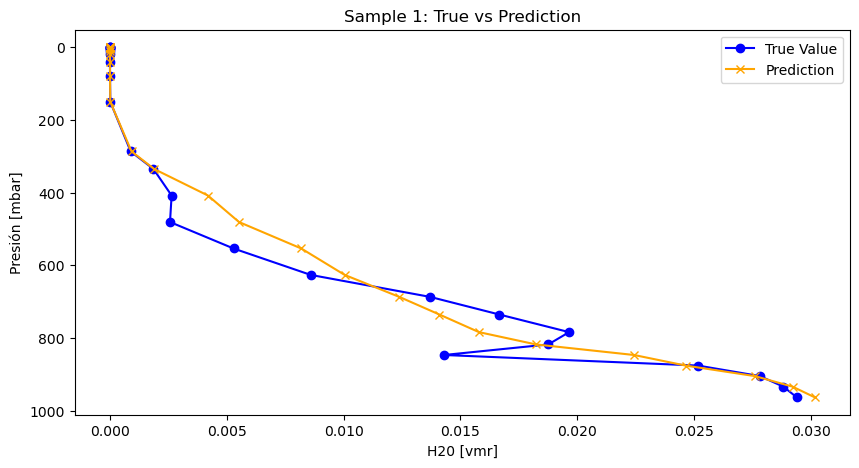

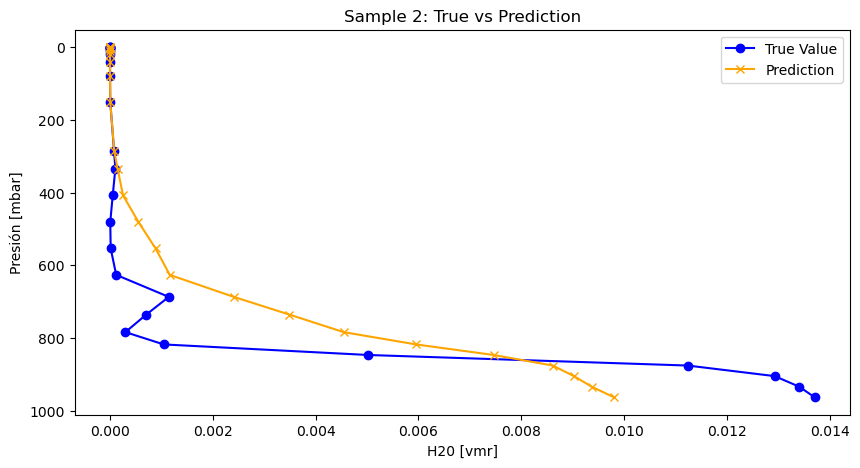

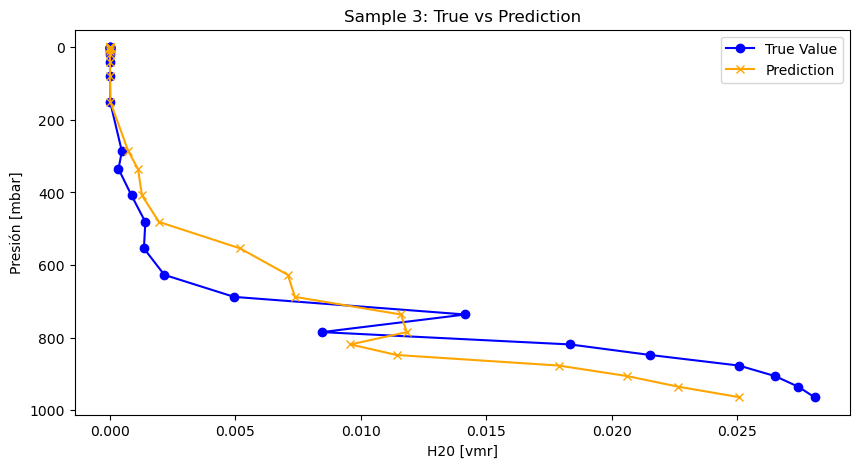

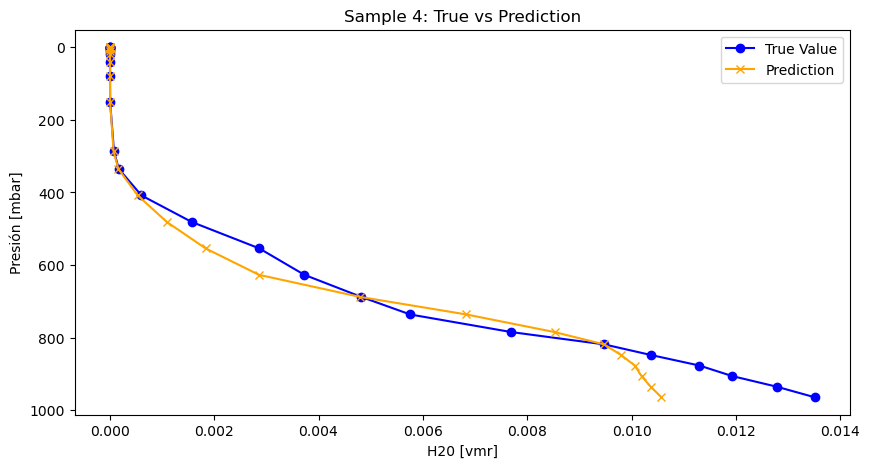

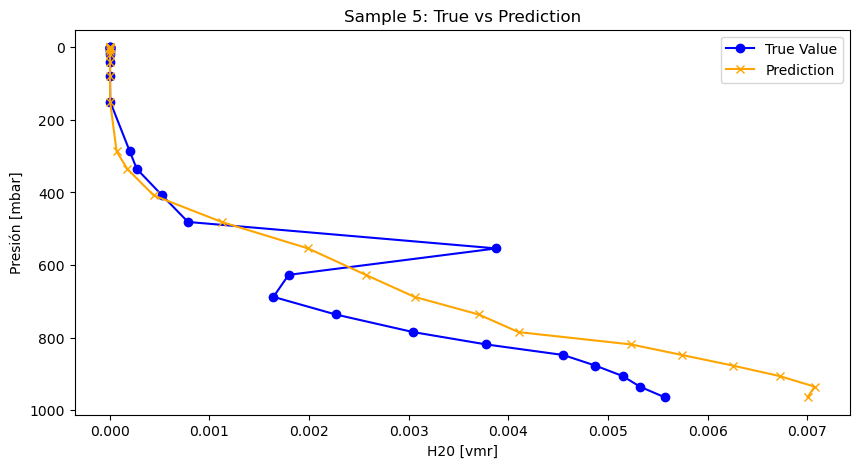

...

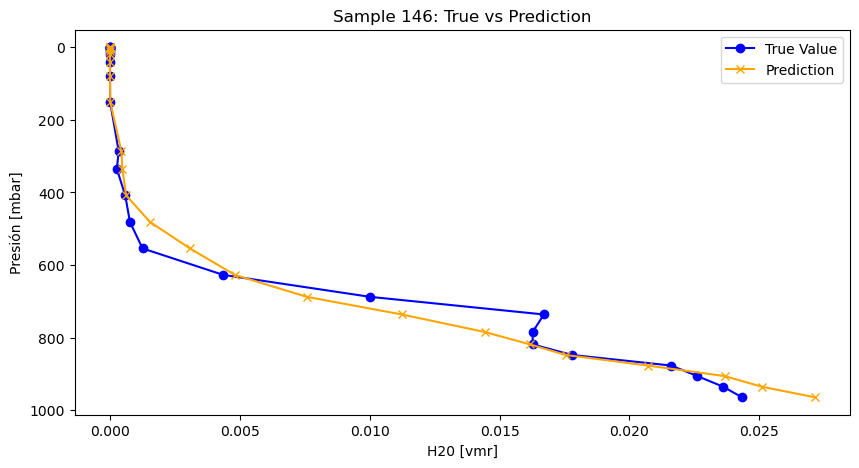

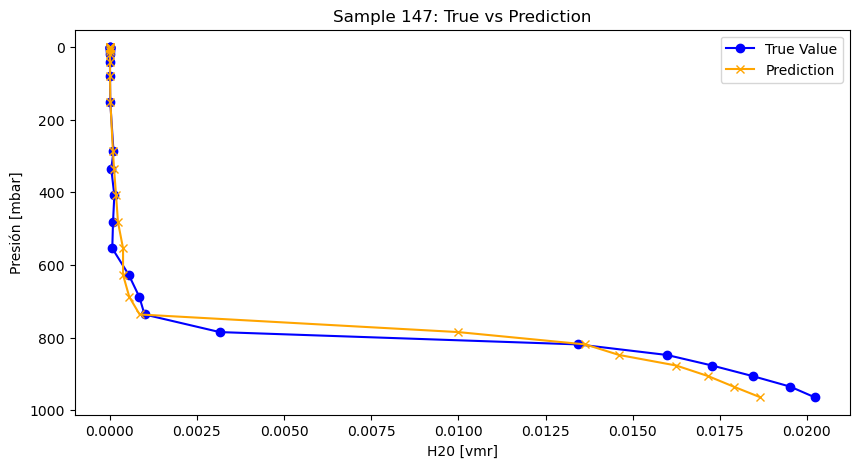

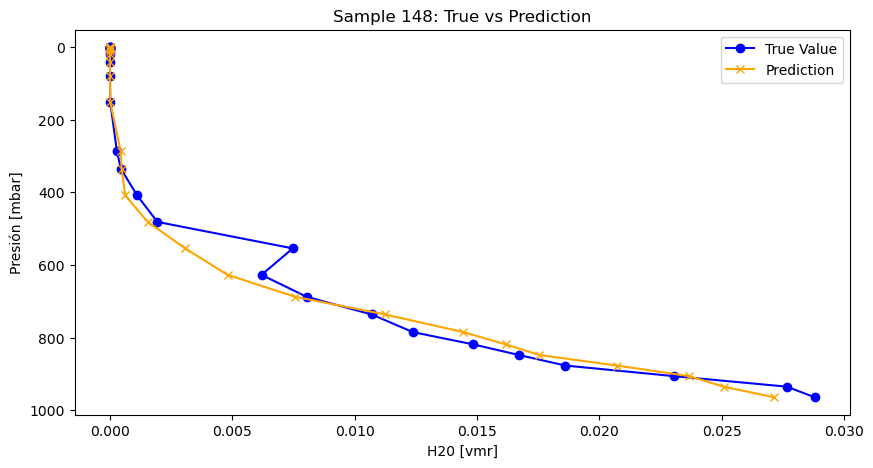

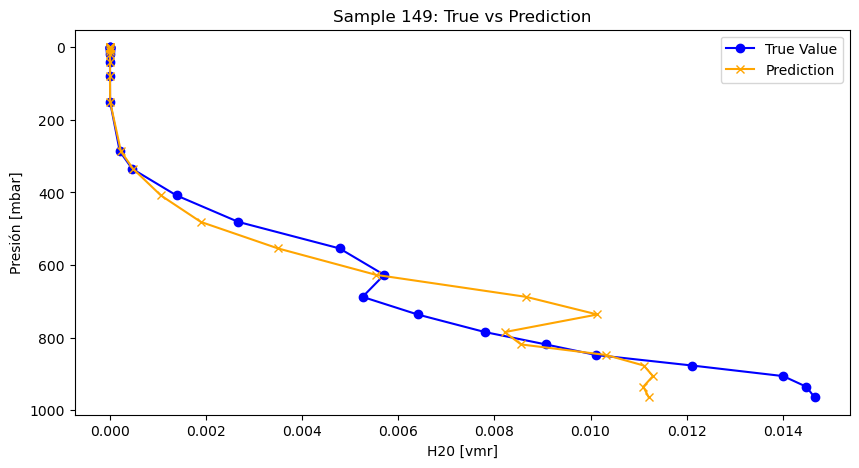

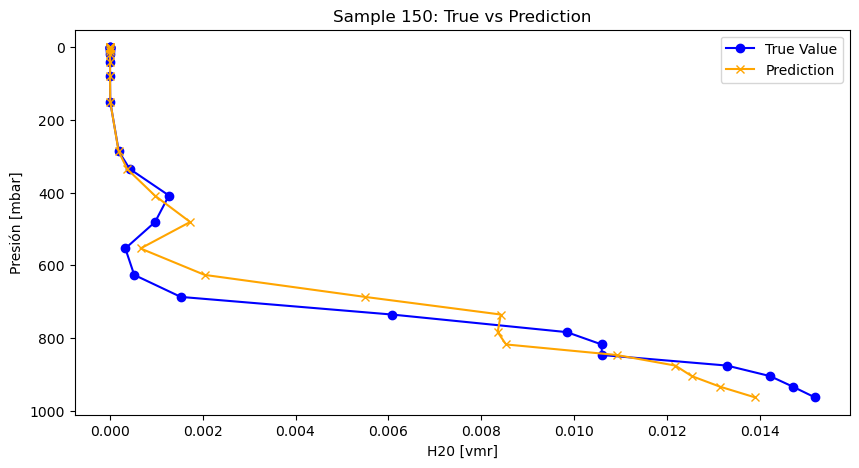

(DecisionTreeRegressor(min_samples_leaf=5, random_state=42),
 0.0007429363300127655,
 0.0015998037074537435,
 0.7994240750337803,
 0.7964020863657749,
 0.0033574633528387033)

In [116]:
import numpy as np
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score, GridSearchCV
import matplotlib.pyplot as plt
import zipfile

def load_pressure_data(file_index, zip_path="atributos.zip"):
    """Carga la primera columna (presión) del archivo correspondiente dentro del ZIP."""
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        # Construir el nombre del archivo dentro del ZIP directamente sin subcarpetas
        file_name = f"atributos/{file_index}.txt"
        
        # Verificar si el archivo existe dentro del ZIP
        if file_name not in zip_ref.namelist():
            raise FileNotFoundError(f"Archivo {file_name} no encontrado en el ZIP.")
        
        # Abrir el archivo dentro del ZIP y cargar los datos
        with zip_ref.open(file_name) as file:
            # Leer las líneas, decodificar y reemplazar las comas
            lines = [line.decode('utf-8').replace(',', '') for line in file.readlines()]
            # Convertir el contenido limpio en un array numpy
            data = np.loadtxt(lines)
    
    # Retornar solo la primera columna (presión)
    return data[:, 0]  # Primera columna: presión

def plot_profiles(test_targets, predictions, file_indices, zip_path="atributos.zip"):
    """
    Genera gráficos para cada predicción, considerando las presiones del archivo correspondiente dentro del ZIP.
    """
    for i, index in enumerate(file_indices[:150]):  # Graficar solo los primeros 5
        pressures = load_pressure_data(index, zip_path)
        plt.figure(figsize=(10, 5))
        plt.plot(test_targets[i], pressures, label='True Value', marker='o', color='blue')  # Invertir ejes
        plt.plot(predictions[i], pressures, label='Prediction', marker='x', color='orange')  # Invertir ejes
        plt.title(f"Sample {index}: True vs Prediction")
        plt.xlabel("H20 [vmr]")  # Ahora h20 está en el eje horizontal
        plt.ylabel("Presión [mbar]")  # Presión en el eje vertical
        plt.gca().invert_yaxis()  # Invertir el eje Y para que la presión se represente correctamente
        plt.legend()
        plt.show()



def train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets, test_indices, zip_path="atributos.zip"):
    # Crear el modelo
    model = DecisionTreeRegressor(random_state=42)
    
    # Establecer los parámetros para la búsqueda en cuadrícula
    param_grid = {
        'max_depth': [3, 5, 7, None],
        'min_samples_split': [2, 5, 10],
        'min_samples_leaf': [1, 2, 5],
        'max_features': ['auto', 'sqrt', 'log2', None]
    }

    # Búsqueda en cuadrícula con validación cruzada (5 pliegues)
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2', n_jobs=-1)
    grid_search.fit(train_inputs, train_targets)
    
    # Mejor modelo encontrado a través de la búsqueda en cuadrícula
    best_model = grid_search.best_estimator_

    # Mostrar los mejores hiperparámetros seleccionados por GridSearchCV
    print("Mejores hiperparámetros encontrados por GridSearchCV:")
    print(grid_search.best_params_)

    # Evaluación utilizando validación cruzada
    cv_r2_scores = cross_val_score(best_model, train_inputs, train_targets, cv=5, scoring='r2')
    print(f"Validación cruzada (5 pliegues) - R² promedio: {cv_r2_scores.mean():.4f}")
    print(f"Desviación estándar de R² en validación cruzada: {cv_r2_scores.std():.4f}")
    
    # Entrenar el mejor modelo en todo el conjunto de entrenamiento
    best_model.fit(train_inputs, train_targets)
    
    # Evaluación en el conjunto de test
    predictions = best_model.predict(test_inputs)
    mae = mean_absolute_error(test_targets, predictions)
    rmse = np.sqrt(mean_squared_error(test_targets, predictions))
    r2_avg = r2_score(test_targets, predictions)
    
    print(f"\nEvaluación del modelo en el conjunto de test:")
    print(f"Mean Absolute Error (MAE): {mae:.4f}")
    print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")
    print(f"R² Score en Test Set: {r2_avg:.4f}")
    
    # Graficar perfiles por presiones y predicciones
    plot_profiles(test_targets, predictions, test_indices, zip_path)
    
    return best_model, mae, rmse, r2_avg, cv_r2_scores.mean(), cv_r2_scores.std()

train_and_evaluate_decisiontree(train_inputs, train_targets, test_inputs, test_targets, test_indices=[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150])
